In [1]:
import sys
sys.path.append("..") 

import pandas as pd
from pandas.api.types import CategoricalDtype
import numpy as np
import os
from os.path import exists
import xarray as xr

import pymc as pm
import pytensor
import pytensor.tensor as pt
import matplotlib.pyplot as plt
import seaborn as sns
import arviz as az
from statsmodels.tsa.seasonal import STL

config = {
    'figure.figsize':(14,4),
    'figure.constrained_layout.use':True,
    'figure.facecolor':'w',
    'axes.grid':True,
    'grid.linewidth':0.5,
    'grid.linestyle':'--',
    'axes.spines.top':False,
    'axes.spines.bottom':False,
    'axes.spines.left':False,
    'axes.spines.right':False
}

plt.rcParams.update(config)

SEED = sum(list(map(ord, 'climate_bayes')))
rng = np.random.default_rng(SEED)

In [2]:
from laos_gggi import load_all_data
from laos_gggi.replication_data import create_replication_data
from laos_gggi.sample import sample_or_load

# Data loading and preparation

In [3]:
df = create_replication_data()

C:\Users\camil\Documents\Servicios\OCDE-GGI\laos-climate-change\notebooks\..\laos_gggi\data_functions\emdat_processing.py:45: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_raw["disaster_class"].loc[
C:\Users\camil\Documents\Servicios\OCDE

# Utilities and functions

In [4]:
#Creating idx
idx = xr.Coordinates.from_pandas_multiindex(df.set_index(["ISO", "year"]).index , dim = "obs_idx")

#Creating results_dict
results_dict = {}

In [5]:
#Define features and normalize variables
df1 = df.drop(columns = "ISO")

df_norm = (df1 -df1.mean())/ df1.std()

standard_deviations = df1.std()

C:\Users\camil\AppData\Local\Temp\ipykernel_81500\609827303.py:4: PerformanceWarning: Adding/subtracting object-dtype array to DatetimeArray not vectorized.
  df_norm = (df1 -df1.mean())/ df1.std()


In [6]:
#Define data function
def add_data(features: list[str], target: str, df: pd.DataFrame = df, add_time :bool = False):
    with pm.modelcontext(None):
       X = pm.Data("X", df_norm[features], dims = ["obs_idx", "feature"] )
       Y = pm.Data("Y", df[target], dims = ["obs_idx"])
       time = pm.Data("time", df["time_period"])
    if add_time:
        return X, Y, time
    else:
        return X,Y

#Add country fixed effect function
def add_country_effect():
  with pm.modelcontext(None):
    country_effect_mu = pm.Normal('country_effect_mu', mu = 0, sigma = 1)
    country_effect_scale = pm.Gamma('country_effect_scale', alpha=2, beta=1)
    country_effect_offset = pm.Normal('country_effect_offset', sigma=1, dims="ISO")
    country_effect = pm.Deterministic('country_effect', country_effect_mu + country_effect_scale * country_effect_offset, dims="ISO")
   
  return country_effect, country_effect_mu, country_effect_scale, country_effect_offset


#Define distribution function
def add_obs_distribution(mu, Y, dist: str ="ZIN_Binomial"):
    with pm.modelcontext(None):
        psi = pm.Beta('psi', alpha=2, beta=5)
        alpha = pm.Exponential("alpha",1)
        
        if dist == "ZIN_Binomial":
            y_hat = pm.ZeroInflatedNegativeBinomial("y_hat", mu=mu, psi = psi, alpha = alpha , observed= Y , dims = ["obs_idx"])
        if dist == "ZI_Poisson":
            y_hat = pm.ZeroInflatedPoisson("y_hat", mu=mu, psi = psi, observed= Y , dims = ["obs_idx"])
            
    return y_hat

In [7]:
# Function to create plot inputs
def generate_plot_inputs(idata, disaster_type: str = "hydrological_disasters"):
    #Extract predictions
    predictions = idata.posterior_predictive['y_hat'].mean(dim=['chain', 'draw'])
    predictions = predictions.to_dataframe().drop(columns = ["year", "ISO"]).reset_index().rename(columns = {"y_hat": "predictions"})

    hdi_mean = az.hdi(idata.posterior_predictive.y_hat)

    hdi = hdi_mean['y_hat'].to_dataframe().drop(columns = ["year", "ISO"]).reset_index()

    hdi_mean_50 = az.hdi(idata.posterior_predictive.y_hat, hdi_prob=.5)
    
    hdi_50 = hdi_mean_50['y_hat'].to_dataframe().drop(columns = ["year", "ISO"]).reset_index()

    #Merge results and predictions in one df
    df_predictions = df[[disaster_type, "ISO", "year"]]

    #95% HDI
    df_predictions = ( pd.merge(df_predictions,  hdi.query('hdi == "lower"')[["ISO", "year", "y_hat"]] , 
             left_on= ["ISO", "year"], right_on= ["ISO", "year"], how = "left")
                     .rename(columns = {"y_hat": "lower_y_hat_95"}))
    df_predictions = (pd.merge(df_predictions, hdi.query('hdi == "higher"')[["ISO", "year", "y_hat"]] ,
         left_on= ["ISO", "year"], right_on= ["ISO", "year"], how = "left")
                     .rename(columns = {"y_hat": "higher_y_hat_95"}))
    #50% HDI
    df_predictions = ( pd.merge(df_predictions,  hdi_50.query('hdi == "lower"')[["ISO", "year", "y_hat"]] , 
             left_on= ["ISO", "year"], right_on= ["ISO", "year"], how = "left")
                     .rename(columns = {"y_hat": "lower_y_hat_50"}))
    df_predictions = (pd.merge(df_predictions, hdi_50.query('hdi == "higher"')[["ISO", "year", "y_hat"]] ,
         left_on= ["ISO", "year"], right_on= ["ISO", "year"], how = "left")
                     .rename(columns = {"y_hat": "higher_y_hat_50"}))
    
    #Predictions
    df_predictions = (pd.merge(df_predictions, predictions ,
             left_on= ["ISO", "year"], right_on= ["ISO", "year"], how = "left")
             .rename(columns = {"y_hat": "predictions"}))
    
    return df_predictions

In [8]:
#Plotting function
def plotting_function(idata,disaster_type, country: str):
    df_predictions = generate_plot_inputs(idata = idata, disaster_type = disaster_type)

    #Filter country
    data = df_predictions.query("ISO == @country")
    
    fig, ax = plt.subplots()
    ax.plot(data["year"], data["predictions"], zorder=1000, color='tab:red', label='Mean Predicted Disaster Count')
    ax.scatter(data["year"], data[disaster_type], color='k', label='Actual Disaster Count')
    ax.fill_between(data["year"], data["higher_y_hat_95"], data["lower_y_hat_95"], alpha=0.25, color='tab:blue', label='95% HDI')
    ax.fill_between(data["year"], data["lower_y_hat_50"], data["higher_y_hat_50"], alpha=0.5, color='tab:blue', label='50% HDI')
    ax.legend(loc='upper left')

    #plt.title(f"{country} disaster count and predictions")

    plt.xlabel("Year")
    plt.ylabel("Disaster Count")
    
    plt.show();
    

In [9]:
def plot_ppc_loopit(idata, title):
    fig = plt.figure(figsize=(12,9))
    ax_ppc = fig.add_subplot(211)
    ax1 = fig.add_subplot(223); ax2 = fig.add_subplot(224)
    az.plot_ppc(idata, ax=ax_ppc);
    for ax, ecdf in zip([ax1, ax2], (False, True)):
        az.plot_loo_pit(idata, y="y_hat", ecdf=ecdf, ax=ax);
    ax_ppc.set_title(title)
    ax_ppc.set_xlabel("")
    return np.array([ax_ppc, ax1, ax2])

## version_0_model_HydroMeteorological: no dev_from_trend_ocean_temp fully pooled

In [10]:
features_0H = ["ln_population_density", "ln_gdp_pc", "square_ln_gdp_p", "precip_deviation", "co2", "population"]

In [11]:
#Set coordinates
ISO_idx, ISO =  pd.factorize(df["ISO"])
obs_idx = df.index

COORDS = {'ISO':ISO, 
          #'Year_vals':df['Start_Year'].cat.categories.values,
          "obs_idx": obs_idx,
         "feature": features_0H}

In [12]:
#HydroMeteorological Disasters

with pm.Model(coords=COORDS) as version_0_model_HydroMeteorological:
    #Declare data
    X, Y= add_data(features= features_0H ,  target = "hydrological_disasters" )
    
    #Country effect
    country_effect = pm.Normal("country_effect", mu = 0, sigma =1, dims = ["ISO"])

    #Betas
    beta_sigma = [ 1, 1, 1, 1, 1,1]
    beta = pm.Normal("beta", mu = 0, sigma = beta_sigma, dims = ["feature"])

    #Model mu
    mu = pm.math.exp(country_effect[ISO_idx] + X @ beta)

    y_hat = add_obs_distribution(mu = mu , Y =Y, dist = "ZIN_Binomial")

In [13]:
#Sampling
with version_0_model_HydroMeteorological:
    version_0_model_HydroMeteorological_idata =sample_or_load(
            fp="version_0_model_HydroMeteorological",
            resample=False,
            sample_kwargs={
                "nuts_sampler": 'nutpie',
                "chains": 8,
                "draws": 1000,
            })

    version_0_model_HydroMeteorological_idata = version_0_model_HydroMeteorological_idata.assign_coords(idx)

results_dict["version_0_model_HydroMeteorological_idata"] = version_0_model_HydroMeteorological_idata

### Summary

In [14]:
az.summary(version_0_model_HydroMeteorological_idata, ["~country_effect", "~country_effect_offset"])

C:\Users\camil\anaconda3\envs\pymc_env\Lib\site-packages\arviz\utils.py:142: UserWarning: Items starting with ~: ['country_effect_offset'] have not been found and will be ignored
  warnings.warn(


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,10.672,1.516,7.938,13.490,0.017,0.012,8608.0,6072.0,1.00
alpha_log__,2.358,0.140,2.096,2.621,0.002,0.001,8608.0,6072.0,1.00
beta[ln_population_density],0.322,0.079,0.168,0.462,0.004,0.003,436.0,888.0,1.01
beta[ln_gdp_pc],0.527,0.409,-0.242,1.274,0.043,0.030,93.0,289.0,1.09
beta[square_ln_gdp_p],-0.968,0.425,-1.710,-0.157,0.044,0.031,96.0,293.0,1.09
beta[precip_deviation],0.173,0.016,0.144,0.204,0.000,0.000,10138.0,5918.0,1.00
beta[co2],0.308,0.024,0.264,0.355,0.001,0.001,1008.0,2355.0,1.00
beta[population],0.221,0.045,0.137,0.308,0.002,0.002,432.0,685.0,1.01
psi,0.987,0.005,0.977,0.996,0.000,0.000,8474.0,5312.0,1.00
psi_logodds__,4.419,0.447,3.649,5.293,0.005,0.004,8474.0,5312.0,1.00


### Traces

C:\Users\camil\anaconda3\envs\pymc_env\Lib\site-packages\arviz\utils.py:142: UserWarning: Items starting with ~: ['country_effect_offset'] have not been found and will be ignored
  warnings.warn(


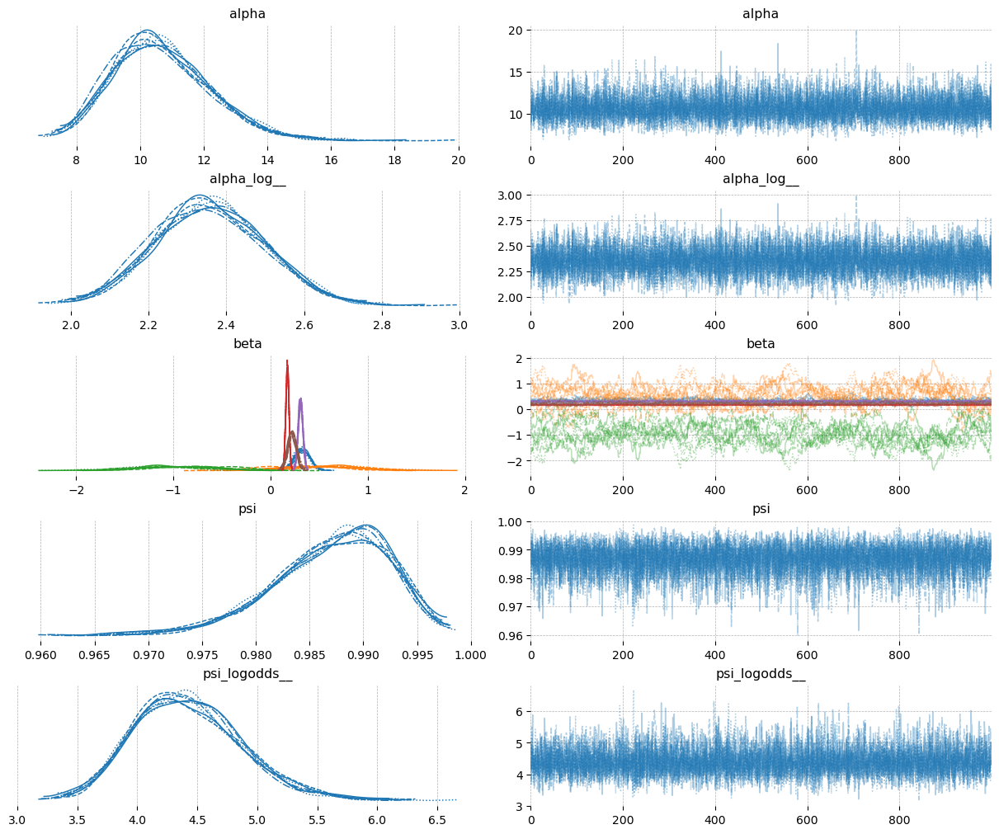

In [15]:
az.plot_trace(version_0_model_HydroMeteorological_idata, var_names =  ["~country_effect", "~country_effect_offset"]);

### PPC

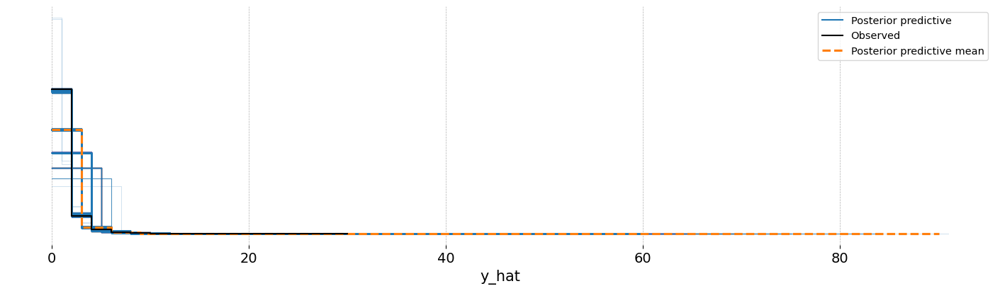

In [16]:
az.plot_ppc(version_0_model_HydroMeteorological_idata);

### Posterior

In [17]:
paper_parameters_0H = [0.196, 0.219, -0.0169, 0.0155, 0.0177, 0.00221]

In [18]:
standard_deviations[features_0H].values

array([1.3228041322813326, 1.4612095943849457, 24.485416868562634,
       173.30753140401507, 21.316935431970528, 139.230085772638],
      dtype=object)

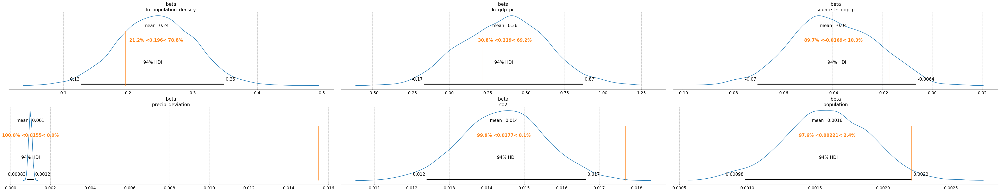

In [19]:
#To de-normalize the parameters
az.plot_posterior((version_0_model_HydroMeteorological_idata.posterior.beta / standard_deviations[features_0H].values).astype(float) , 
                  var_names=["beta"],
                 ref_val= paper_parameters_0H);

###  inverse cdf uniform transform plot

C:\Users\camil\AppData\Local\Temp\ipykernel_81500\1294632583.py:2: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


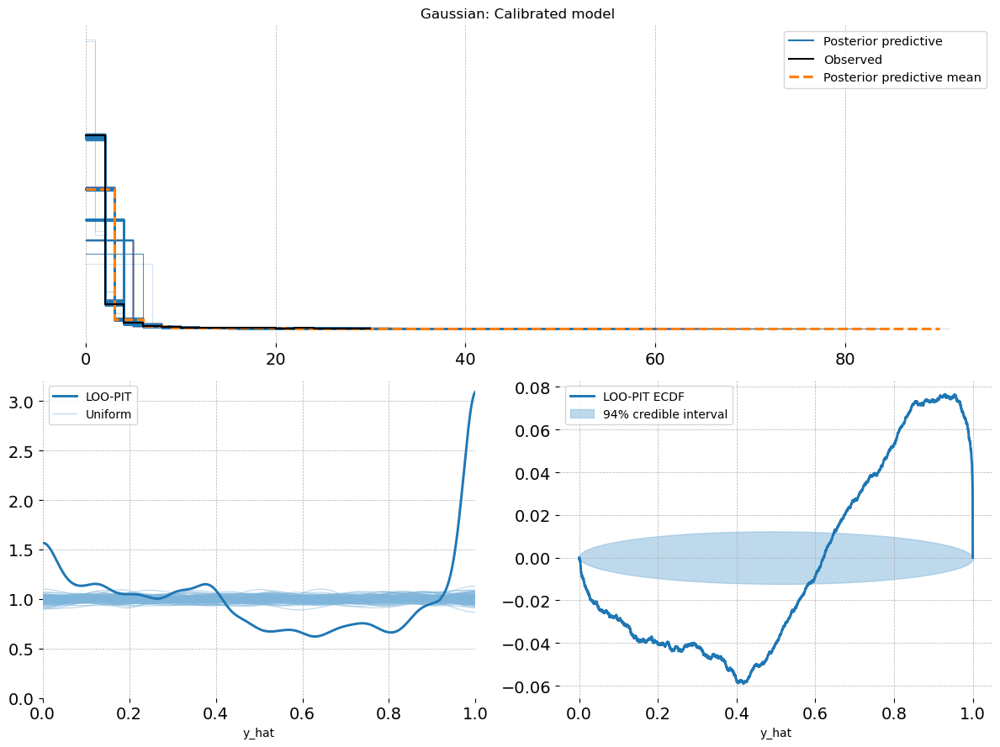

In [20]:
plot_ppc_loopit(version_0_model_HydroMeteorological_idata, "Gaussian: Calibrated model")
plt.tight_layout();

### Predictions

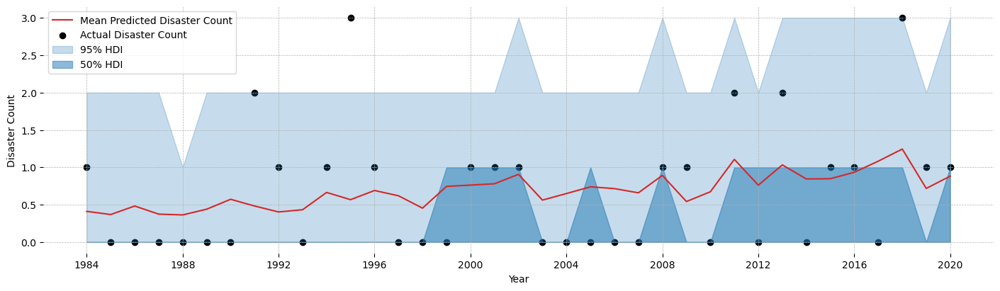

In [21]:
plotting_function(idata = version_0_model_HydroMeteorological_idata,
                  disaster_type = "hydrological_disasters",
                  country= "LAO")

## version_1_model_HydroMeteorological: no dev_from_trend_ocean_temp

In [22]:
features_1H = ["ln_population_density", "ln_gdp_pc", "square_ln_gdp_p", "precip_deviation", "co2", "population"]

In [23]:
#Set coordinates
ISO_idx, ISO =  pd.factorize(df["ISO"])
obs_idx = df.index

COORDS = {'ISO':ISO, 
          #'Year_vals':df['Start_Year'].cat.categories.values,
          "obs_idx": obs_idx,
         "feature": features_1H}

In [24]:
#HydroMeteorological Disasters

with pm.Model(coords=COORDS) as version_1_model_HydroMeteorological:
    #Declare data
    X, Y= add_data(features= features_1H ,  target = "hydrological_disasters" )
    
    #Country effect
    country_effect, country_effect_mu, country_effect_scale, country_effect_offset = add_country_effect()

    #Betas
    beta_sigma = [ 1, 1, 1, 1, 1,1]
    beta = pm.Normal("beta", mu = 0, sigma = beta_sigma, dims = ["feature"])

    #Model mu
    mu = pm.math.exp(country_effect[ISO_idx] + X @ beta)

    y_hat = add_obs_distribution(mu = mu , Y =Y, dist = "ZIN_Binomial")

In [25]:
#Sampling
with version_1_model_HydroMeteorological:
    version_1_model_HydroMeteorological_idata =sample_or_load(
            fp="version_1_model_HydroMeteorological",
            resample=False,
            sample_kwargs={
                "nuts_sampler": 'nutpie',
                "chains": 8,
                "draws": 1000,
            })

    version_1_model_HydroMeteorological_idata = version_1_model_HydroMeteorological_idata.assign_coords(idx)

results_dict["version_1_model_HydroMeteorological_idata"] = version_1_model_HydroMeteorological_idata

C:\Users\camil\anaconda3\envs\pymc_env\Lib\site-packages\nutpie\compile_pymc.py:508: NumbaWarning: Cannot cache compiled function "numba_funcified_fgraph" as it uses dynamic globals (such as ctypes pointers and large global arrays)
  return inner(x, *_shared_tuple)


Progress,Draws,Divergences,Step Size,Gradients/Draw
,2000,0,0.22,15
,2000,0,0.22,15
,2000,0,0.22,63
,2000,0,0.22,15
,2000,0,0.21,15
,2000,0,0.22,15
,2000,0,0.24,31
,2000,0,0.20,31


Sampling: [y_hat]


Output()

Output()

### Summary

In [26]:
az.summary(version_1_model_HydroMeteorological_idata, ["~country_effect", "~country_effect_offset"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,10.459,1.487,7.905,13.373,0.016,0.012,9107.0,5768.0,1.00
alpha_log__,2.338,0.140,2.074,2.599,0.001,0.001,9107.0,5768.0,1.00
beta[ln_population_density],0.398,0.099,0.219,0.586,0.005,0.004,347.0,599.0,1.02
beta[ln_gdp_pc],0.739,0.397,0.015,1.506,0.030,0.021,177.0,438.0,1.03
beta[square_ln_gdp_p],-1.251,0.413,-2.053,-0.516,0.031,0.022,178.0,393.0,1.03
beta[precip_deviation],0.179,0.016,0.149,0.209,0.000,0.000,8913.0,6449.0,1.00
beta[co2],0.326,0.026,0.279,0.378,0.001,0.001,870.0,2058.0,1.00
beta[population],0.198,0.051,0.099,0.292,0.003,0.002,357.0,756.0,1.03
country_effect_mu,-1.181,0.102,-1.359,-0.981,0.005,0.004,372.0,581.0,1.02
country_effect_scale,1.205,0.087,1.043,1.369,0.004,0.003,447.0,790.0,1.01


### Traces

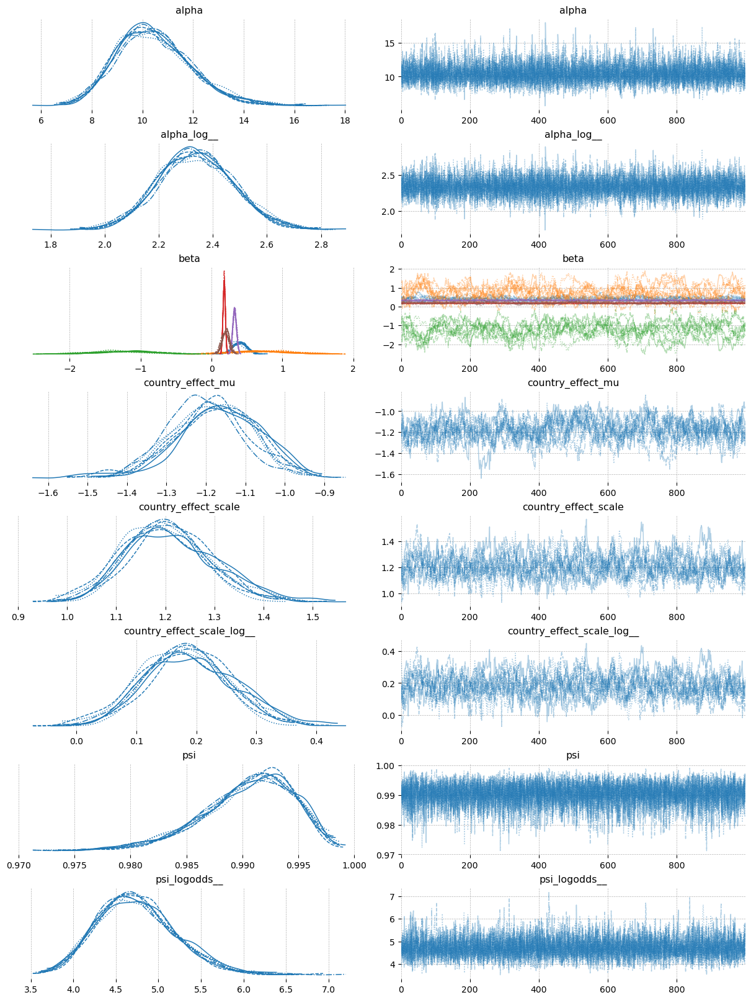

In [27]:
az.plot_trace(version_1_model_HydroMeteorological_idata, var_names =  ["~country_effect", "~country_effect_offset"]);

### PPC

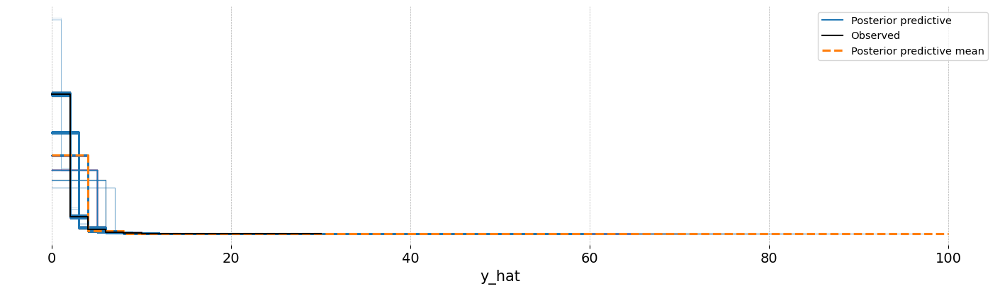

In [28]:
az.plot_ppc(version_1_model_HydroMeteorological_idata);

### Posterior

In [29]:
paper_parameters_1H = [0.196, 0.219, -0.0169, 0.0155, 0.0177, 0.00221]

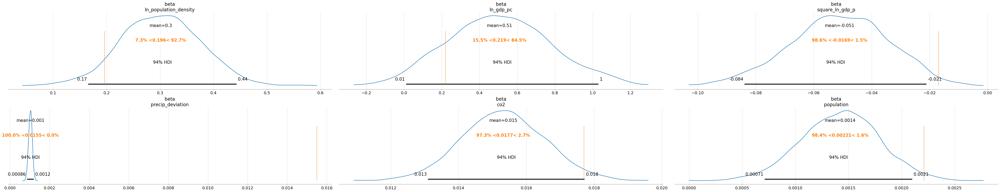

In [30]:
#To de-normalize the parameters
az.plot_posterior((version_1_model_HydroMeteorological_idata.posterior.beta / standard_deviations[features_1H].values).astype(float), 
                  var_names=["beta"],
                 ref_val= paper_parameters_1H);

###  inverse cdf uniform transform plot

C:\Users\camil\AppData\Local\Temp\ipykernel_81500\1630009163.py:2: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


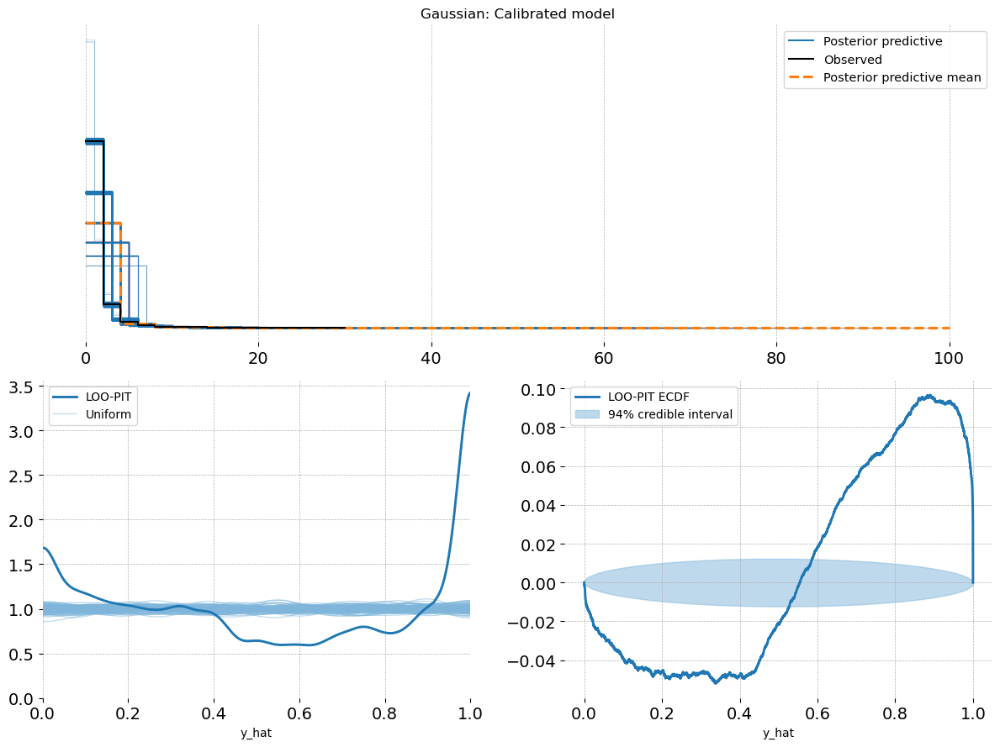

In [31]:
plot_ppc_loopit(version_1_model_HydroMeteorological_idata, "Gaussian: Calibrated model")
plt.tight_layout();

### Predictions

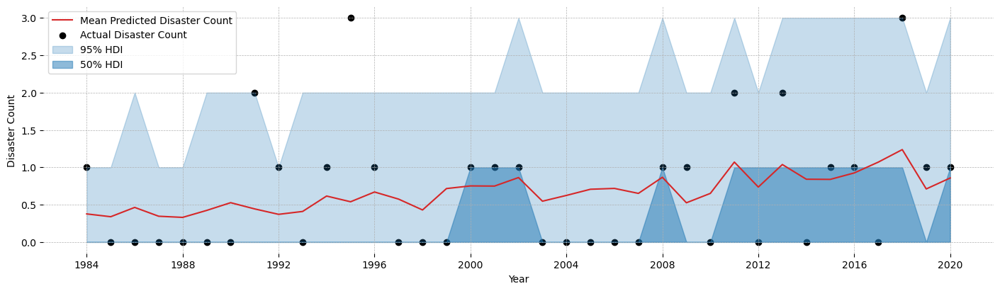

In [32]:
plotting_function(idata = version_1_model_HydroMeteorological_idata,
                  disaster_type = "hydrological_disasters",
                  country= "LAO")

## version_2_model_HydroMeteorological: no co2

In [33]:
#Define features and normalize variables
features_2H = ["ln_population_density", "ln_gdp_pc", "square_ln_gdp_p", "precip_deviation", "dev_from_trend_ocean_temp", "population"]

In [34]:
#Set feature coordinates
COORDS["feature"] =  features_2H

In [35]:
#HydroMeteorological Disasters

with pm.Model(coords=COORDS) as version_2_model_HydroMeteorological:
    #Declare data
    X, Y= add_data(features= features_2H ,  target = "hydrological_disasters" )

    #Country effect
    country_effect, country_effect_mu, country_effect_scale, country_effect_offset = add_country_effect()
    
    #Betas
    beta_sigma = [ 1, 1, 1, 1, 1, 1]
    beta = pm.Normal("beta", mu = 0, sigma = beta_sigma, dims = ["feature"])
    
    #Model mu
    mu = pm.math.exp(country_effect[ISO_idx] + X @ beta)

    y_hat = add_obs_distribution(mu = mu , Y =Y, dist = "ZIN_Binomial")

In [36]:
#Sampling
with version_2_model_HydroMeteorological:
    version_2_model_HydroMeteorological_idata =sample_or_load(
            fp="version_2_model_HydroMeteorological",
            resample=False,
            sample_kwargs={
                "nuts_sampler": 'nutpie',
                "chains": 8,
                "draws": 1000,
            })

    version_2_model_HydroMeteorological_idata = version_2_model_HydroMeteorological_idata.assign_coords(idx)

results_dict["version_2_model_HydroMeteorological_idata"] = version_2_model_HydroMeteorological_idata

C:\Users\camil\anaconda3\envs\pymc_env\Lib\site-packages\nutpie\compile_pymc.py:508: NumbaWarning: Cannot cache compiled function "numba_funcified_fgraph" as it uses dynamic globals (such as ctypes pointers and large global arrays)
  return inner(x, *_shared_tuple)


Progress,Draws,Divergences,Step Size,Gradients/Draw
,2000,0,0.19,15
,2000,0,0.22,15
,2000,0,0.22,15
,2000,0,0.21,15
,2000,0,0.25,15
,2000,0,0.22,15
,2000,0,0.20,15
,2000,0,0.24,15


Sampling: [y_hat]


Output()

Output()

### Summary

In [37]:
az.summary(version_2_model_HydroMeteorological_idata, ["~country_effect", "~country_effect_offset"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,11.393,1.683,8.376,14.527,0.019,0.014,8702.0,6220.0,1.00
alpha_log__,2.422,0.145,2.159,2.706,0.002,0.001,8702.0,6220.0,1.00
beta[ln_population_density],1.419,0.123,1.184,1.638,0.009,0.006,200.0,666.0,1.04
beta[ln_gdp_pc],0.524,0.431,-0.249,1.332,0.045,0.032,94.0,279.0,1.06
beta[square_ln_gdp_p],-0.423,0.448,-1.232,0.426,0.045,0.032,101.0,282.0,1.06
beta[precip_deviation],0.181,0.016,0.152,0.212,0.000,0.000,9091.0,5792.0,1.00
beta[dev_from_trend_ocean_temp],-0.025,0.017,-0.054,0.009,0.000,0.000,10541.0,6350.0,1.00
beta[population],0.156,0.057,0.055,0.269,0.003,0.002,344.0,684.0,1.02
country_effect_mu,-1.228,0.142,-1.488,-0.960,0.010,0.007,201.0,330.0,1.02
country_effect_scale,1.865,0.149,1.579,2.135,0.009,0.007,257.0,575.0,1.03


### Traces

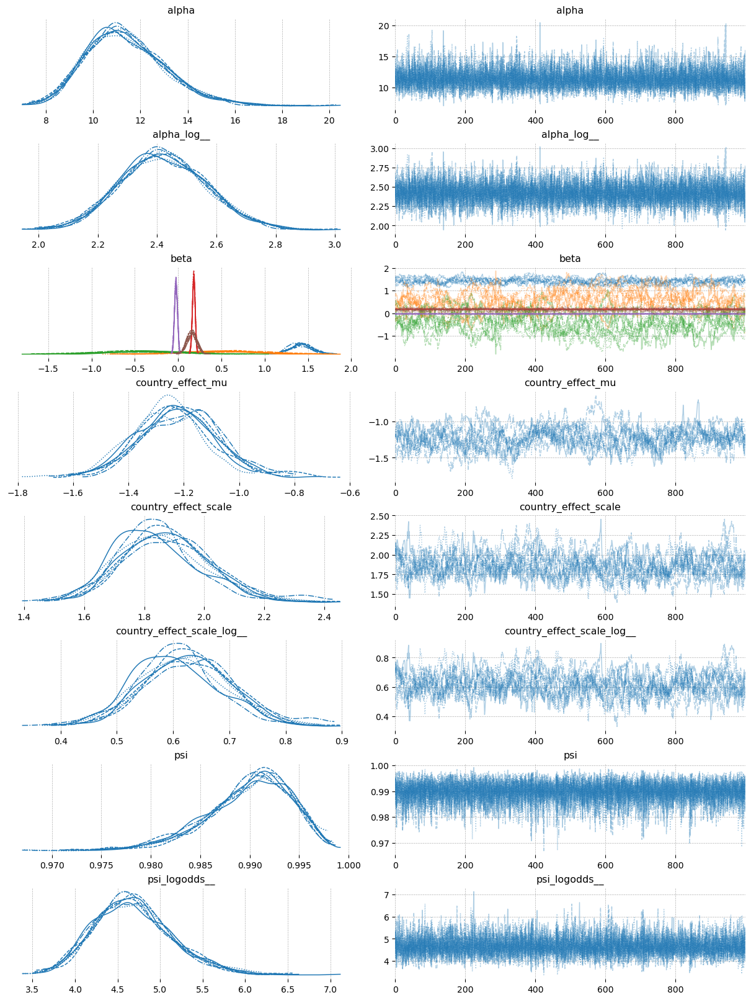

In [38]:
az.plot_trace(version_2_model_HydroMeteorological_idata, var_names =  ["~country_effect", "~country_effect_offset"]);

### PPC

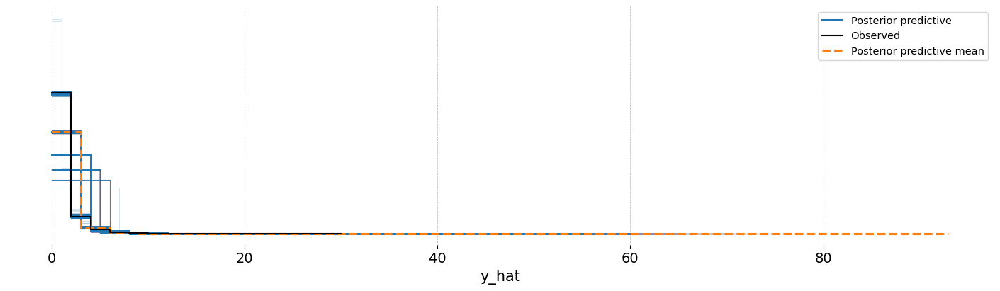

In [39]:
az.plot_ppc(version_2_model_HydroMeteorological_idata);

### Posterior

In [40]:
paper_parameters_2H = [0.196, 0.257, -0.0194, 0.0178, 1.719, 0.00219 ]

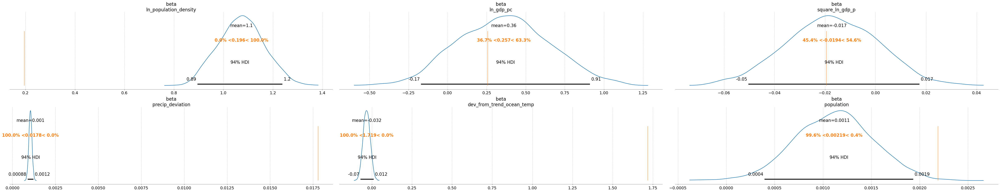

In [41]:
#To de-normalize the parameters
az.plot_posterior((version_2_model_HydroMeteorological_idata.posterior.beta / standard_deviations[features_2H].values).astype(float), 
                  var_names=["beta"],
                 ref_val= paper_parameters_2H);

###  inverse cdf uniform transform plot

C:\Users\camil\AppData\Local\Temp\ipykernel_81500\1954469409.py:2: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


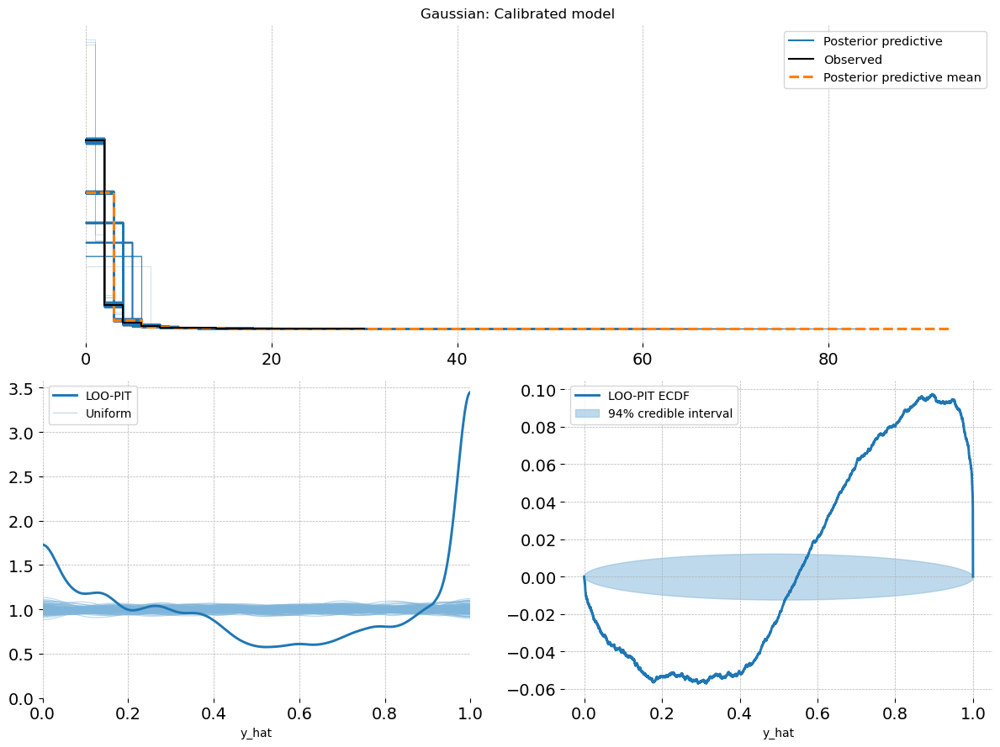

In [42]:
plot_ppc_loopit(version_2_model_HydroMeteorological_idata, "Gaussian: Calibrated model")
plt.tight_layout();

### Predictions

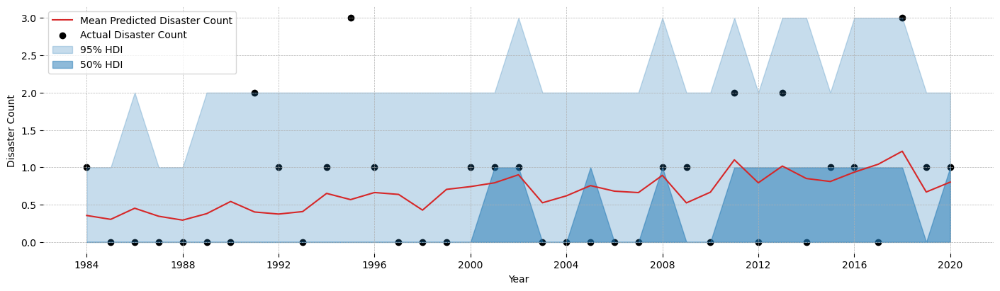

In [43]:
plotting_function(idata = version_2_model_HydroMeteorological_idata,
                  disaster_type = "hydrological_disasters",
                  country= "LAO")

## version_3_model_HydroMeteorological: time trend, no dev_from_trend_ocean_temp, no dev_from_trend_ocean_temp 

In [44]:
#Define features and normalize variables
features_3H = ["ln_population_density", "ln_gdp_pc", "square_ln_gdp_p", "precip_deviation", "population"]

In [45]:
#Set feature coordinates
COORDS["feature"] =  features_3H

In [46]:
#HydroMeteorological Disasters

with pm.Model(coords=COORDS) as version_3_model_HydroMeteorological:
    #Declare data
    X, Y, time= add_data(features= features_3H ,  target = "hydrological_disasters", add_time=True)

    #Time trend effect
    time_trend = pm.Normal("time_trend", mu =0, sigma =1)
    
    #Country effect
    country_effect, country_effect_mu, country_effect_scale, country_effect_offset = add_country_effect()
    
    #Betas
    beta_sigma = [ 1, 1, 1, 1, 1]
    beta = pm.Normal("beta", mu = 0, sigma = beta_sigma, dims = ["feature"])

    #Model mu
    mu = pm.math.exp(country_effect[ISO_idx] +time_trend * time +  X @ beta)

    y_hat = add_obs_distribution(mu = mu , Y =Y, dist = "ZIN_Binomial")

In [47]:
#Sampling
with version_3_model_HydroMeteorological:
    version_3_model_HydroMeteorological_idata =sample_or_load(
            fp="version_3_model_HydroMeteorological",
            resample=False,
            sample_kwargs={
                "nuts_sampler": 'nutpie',
                "chains": 8,
                "draws": 1000,
            })

    version_3_model_HydroMeteorological_idata = version_3_model_HydroMeteorological_idata.assign_coords(idx)

results_dict["version_3_model_HydroMeteorological_idata"] = version_3_model_HydroMeteorological_idata

C:\Users\camil\anaconda3\envs\pymc_env\Lib\site-packages\nutpie\compile_pymc.py:508: NumbaWarning: Cannot cache compiled function "numba_funcified_fgraph" as it uses dynamic globals (such as ctypes pointers and large global arrays)
  return inner(x, *_shared_tuple)


Progress,Draws,Divergences,Step Size,Gradients/Draw
,2000,0,0.24,15
,2000,0,0.22,15
,2000,0,0.21,15
,2000,0,0.23,15
,2000,0,0.21,15
,2000,0,0.24,15
,2000,0,0.22,15
,2000,0,0.24,15


Sampling: [y_hat]


Output()

Output()

### Summary

In [48]:
az.summary(version_3_model_HydroMeteorological_idata, ["~country_effect", "~country_effect_offset"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,10.913,1.563,8.113,13.827,0.017,0.012,9235.0,5662.0,1.00
alpha_log__,2.380,0.141,2.112,2.641,0.001,0.001,9235.0,5662.0,1.00
beta[ln_population_density],0.368,0.097,0.190,0.550,0.006,0.004,249.0,733.0,1.04
beta[ln_gdp_pc],0.618,0.414,-0.294,1.295,0.038,0.027,117.0,194.0,1.04
beta[square_ln_gdp_p],-1.127,0.436,-1.875,-0.202,0.041,0.029,117.0,208.0,1.04
beta[precip_deviation],0.176,0.016,0.146,0.207,0.000,0.000,9636.0,6252.0,1.00
beta[population],0.189,0.051,0.097,0.291,0.003,0.002,256.0,773.0,1.03
country_effect_mu,-1.819,0.118,-2.038,-1.591,0.006,0.004,352.0,495.0,1.01
country_effect_scale,1.199,0.085,1.041,1.356,0.004,0.003,391.0,818.0,1.02
country_effect_scale_log__,0.179,0.070,0.044,0.307,0.004,0.003,391.0,818.0,1.02


### Traces

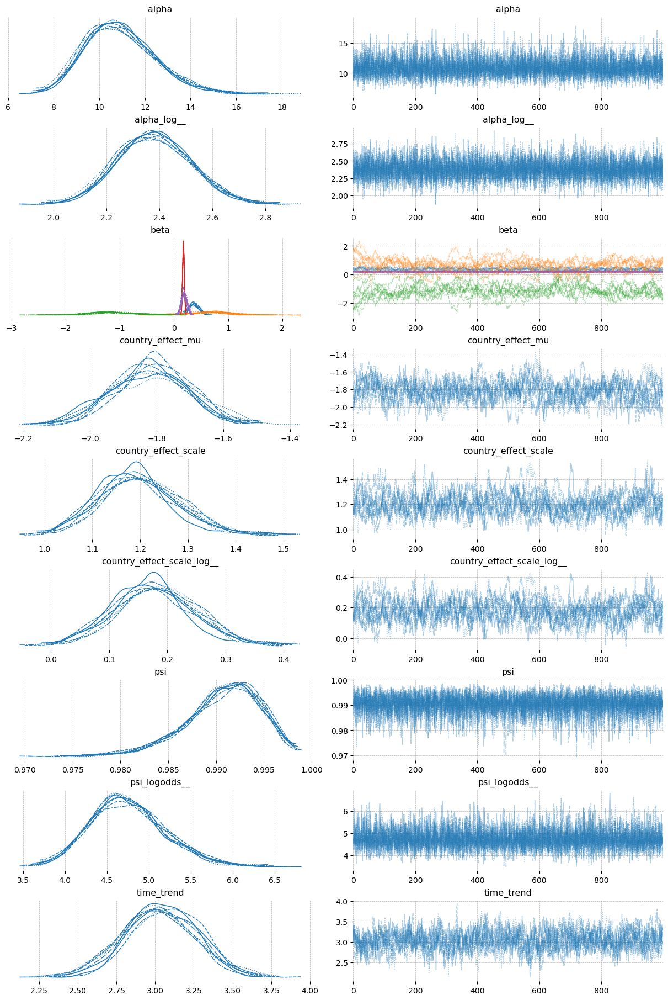

In [49]:
az.plot_trace(version_3_model_HydroMeteorological_idata, var_names =  ["~country_effect", "~country_effect_offset"]);

### PPC

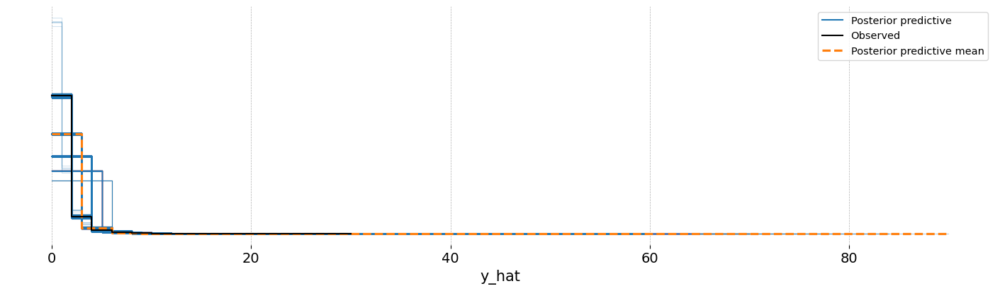

In [50]:
az.plot_ppc(version_3_model_HydroMeteorological_idata);

### Posterior

In [51]:
paper_parameters_3H = [0.199, 0.241, -0.0184, 0.0158, 1.719, 0.00219]

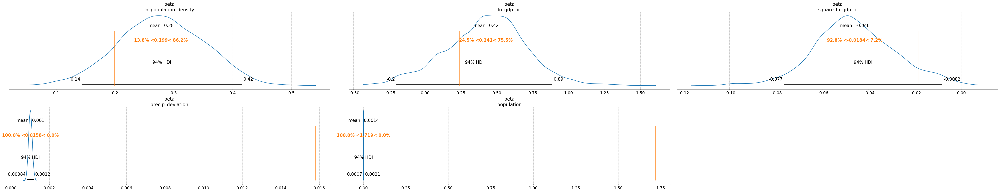

In [52]:
#To de-normalize the parameters
az.plot_posterior((version_3_model_HydroMeteorological_idata.posterior.beta / standard_deviations[features_3H].values).astype(float),
                  var_names=["beta"],
                 ref_val= paper_parameters_3H);

###  inverse cdf uniform transform plot

C:\Users\camil\AppData\Local\Temp\ipykernel_81500\306579669.py:2: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


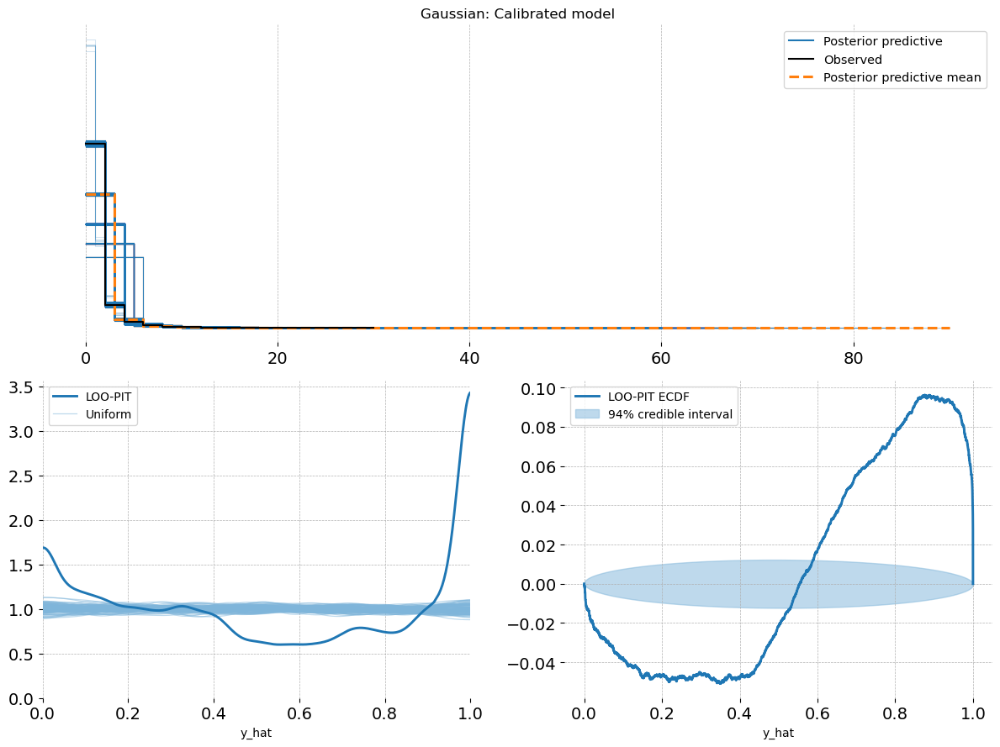

In [53]:
plot_ppc_loopit(version_3_model_HydroMeteorological_idata, "Gaussian: Calibrated model")
plt.tight_layout();

### Predictions

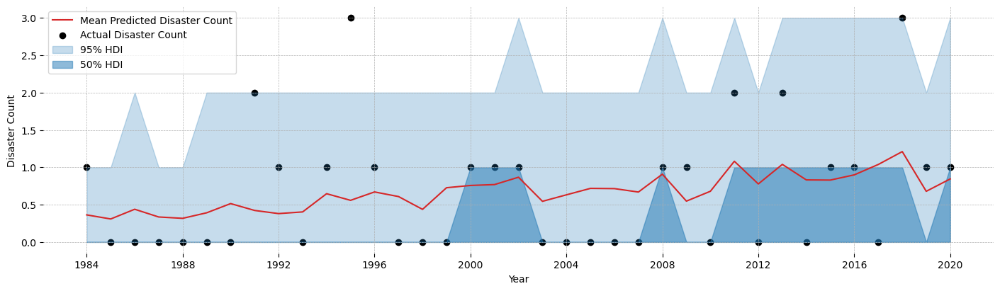

In [54]:
plotting_function(idata = version_3_model_HydroMeteorological_idata,
                  disaster_type = "hydrological_disasters",
                  country= "LAO")

## version_0_model_Climatological: no dev_from_trend_ocean_temp

In [55]:
#Define features and normalize variables
features_0C = ["ln_population_density", "ln_gdp_pc", "square_ln_gdp_p", "precip_deviation", "co2", "population"]

In [56]:
#Set feature coordinates
COORDS["feature"] =  features_0C

In [57]:
#HydroMeteorological Disasters

with pm.Model(coords=COORDS) as version_0_model_Climatological:
    #Declare data
    X, Y= add_data(features= features_0C ,  target = "climatological_disasters" )

    #Country effect
    country_effect = pm.Normal("country_effect", mu = 0, sigma =1, dims = ["ISO"])

    #Betas
    beta_sigma = [ 1, 1, 1, 1, 1, 1]
    beta = pm.Normal("beta", mu = 0, sigma = beta_sigma, dims = ["feature"])

    #Model mu
    mu = pm.math.exp(country_effect[ISO_idx] + X @ beta)

    y_hat = add_obs_distribution(mu = mu , Y =Y, dist = "ZI_Poisson")

In [58]:
#Sampling
with version_0_model_Climatological:
    version_0_model_Climatological_idata =sample_or_load(
            fp="version_0_model_Climatological",
            resample=False,
            sample_kwargs={
                "nuts_sampler": 'nutpie',
                "chains": 8,
                "draws": 1000,
            })

    version_0_model_Climatological_idata = version_0_model_Climatological_idata.assign_coords(idx)

results_dict["version_0_model_Climatological_idata"] = version_0_model_Climatological_idata

Progress,Draws,Divergences,Step Size,Gradients/Draw
,2000,0,0.28,15
,2000,0,0.28,15
,2000,0,0.26,15
,2000,0,0.27,15
,2000,0,0.29,15
,2000,0,0.29,15
,2000,0,0.29,15
,2000,0,0.27,31


Sampling: [y_hat]


Output()

Output()

### Summary

In [59]:
az.summary(version_0_model_Climatological_idata, ["~country_effect", "~country_effect_offset"])

C:\Users\camil\anaconda3\envs\pymc_env\Lib\site-packages\arviz\utils.py:142: UserWarning: Items starting with ~: ['country_effect_offset'] have not been found and will be ignored
  warnings.warn(


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,0.983,0.963,0.000,2.751,0.008,0.008,8620.0,4061.0,1.00
alpha_log__,-0.578,1.262,-2.991,1.449,0.017,0.017,8620.0,4061.0,1.00
beta[ln_population_density],-0.120,0.098,-0.307,0.060,0.002,0.002,1884.0,3244.0,1.00
beta[ln_gdp_pc],-0.413,0.532,-1.434,0.552,0.026,0.019,408.0,935.0,1.01
beta[square_ln_gdp_p],0.116,0.539,-0.846,1.168,0.027,0.019,409.0,868.0,1.02
beta[precip_deviation],-0.194,0.048,-0.281,-0.101,0.000,0.000,12054.0,5995.0,1.00
beta[co2],0.178,0.047,0.092,0.268,0.001,0.000,5499.0,5733.0,1.00
beta[population],0.187,0.079,0.025,0.327,0.002,0.002,1040.0,2038.0,1.01
psi,0.320,0.018,0.287,0.354,0.000,0.000,5145.0,6241.0,1.00
psi_logodds__,-0.755,0.082,-0.910,-0.602,0.001,0.001,5145.0,6241.0,1.00


### Traces

C:\Users\camil\anaconda3\envs\pymc_env\Lib\site-packages\arviz\utils.py:142: UserWarning: Items starting with ~: ['country_effect_offset'] have not been found and will be ignored
  warnings.warn(


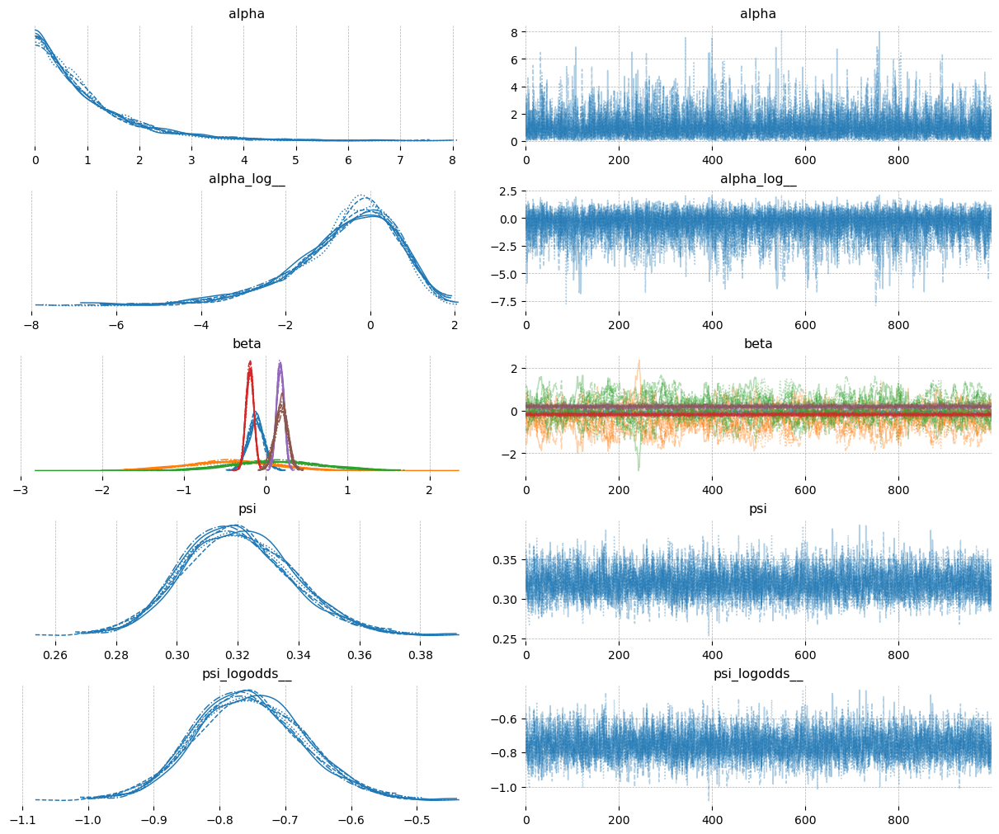

In [60]:
az.plot_trace(version_0_model_Climatological_idata, var_names =  ["~country_effect", "~country_effect_offset"]);

### PPC

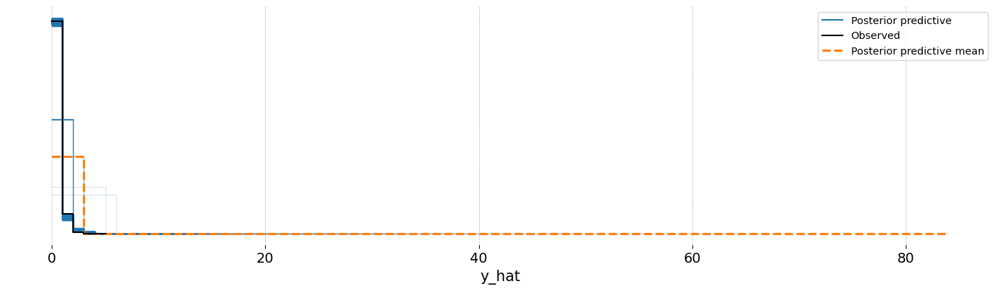

In [61]:
az.plot_ppc(version_0_model_Climatological_idata);

### Posterior

In [62]:
paper_parameters_0C = [-0.105, -1.464, 0.0964, -0.00663, 0.0146 , 0.00147]

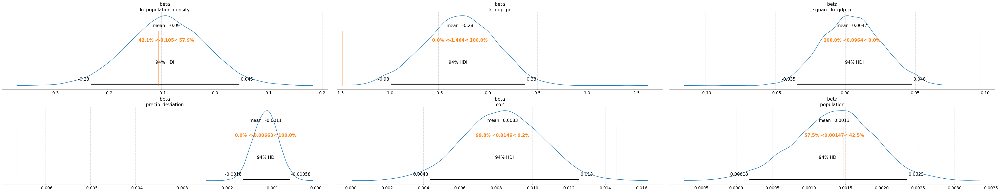

In [63]:
#To de-normalize the parameters
az.plot_posterior((version_0_model_Climatological_idata.posterior.beta / standard_deviations[features_0C].values).astype(float),
                  var_names=["beta"],
                 ref_val= paper_parameters_0C);

###  inverse cdf uniform transform plot

C:\Users\camil\AppData\Local\Temp\ipykernel_81500\368484784.py:2: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


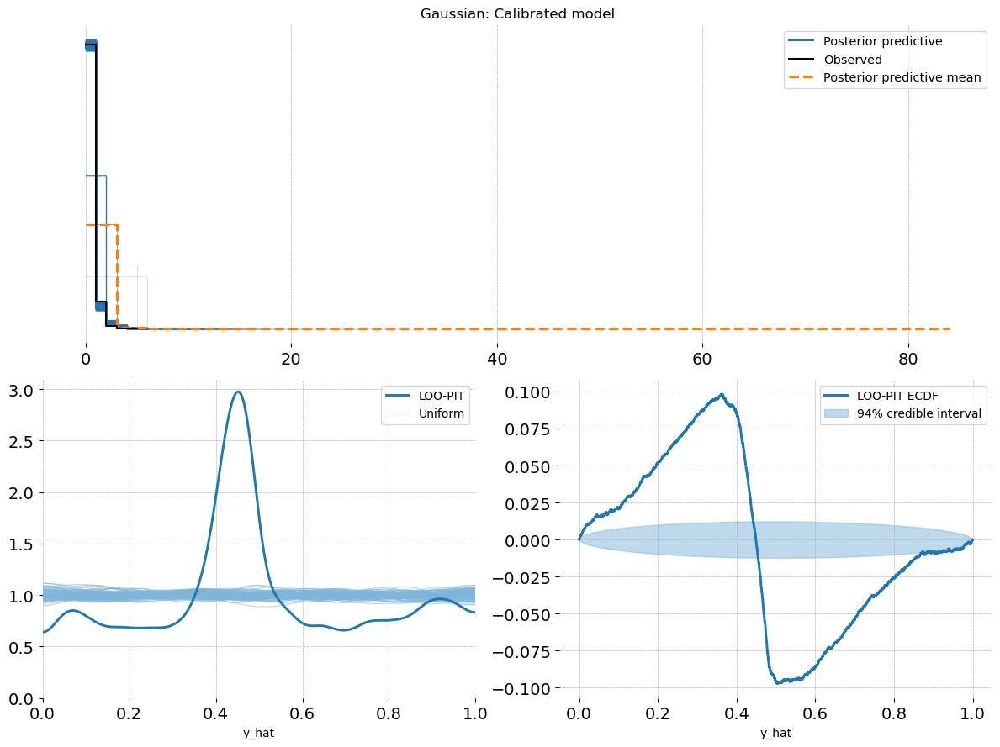

In [64]:
plot_ppc_loopit(version_0_model_Climatological_idata, "Gaussian: Calibrated model")
plt.tight_layout();

### Predictions

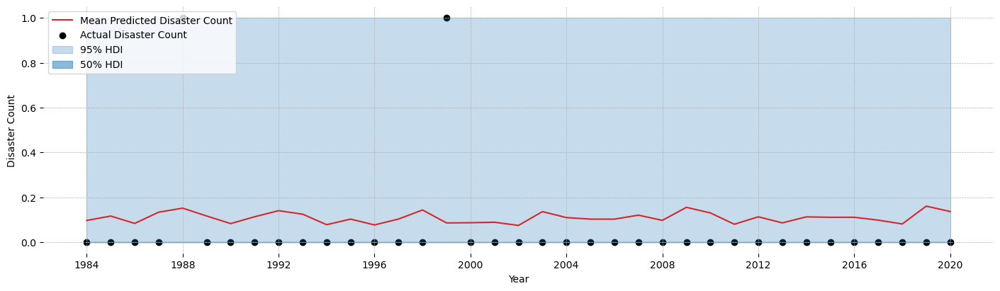

In [65]:
plotting_function(idata = version_0_model_Climatological_idata,
                  disaster_type = "climatological_disasters",
                  country= "LAO")

## version_1_model_Climatological: no dev_from_trend_ocean_temp

In [66]:
#Define features and normalize variables
features_1C = ["ln_population_density", "ln_gdp_pc", "square_ln_gdp_p", "precip_deviation", "co2", "population"]

In [67]:
#Set feature coordinates
COORDS["feature"] =  features_1C

In [68]:
#HydroMeteorological Disasters

with pm.Model(coords=COORDS) as version_1_model_Climatological:
    #Declare data
    X, Y= add_data(features= features_1C ,  target = "climatological_disasters" )

    #Country effect
    country_effect, country_effect_mu, country_effect_scale, country_effect_offset = add_country_effect()

    #Betas
    beta_sigma = [ 1, 1, 1, 1, 1, 1]
    beta = pm.Normal("beta", mu = 0, sigma = beta_sigma, dims = ["feature"])

    #Model mu
    mu = pm.math.exp(country_effect[ISO_idx] + X @ beta)

    y_hat = add_obs_distribution(mu = mu , Y =Y, dist = "ZI_Poisson")

In [69]:
#Sampling
with version_1_model_Climatological:
    version_1_model_Climatological_idata =sample_or_load(
            fp="version_1_model_Climatological",
            resample=False,
            sample_kwargs={
                "nuts_sampler": 'nutpie',
                "chains": 8,
                "draws": 1000,
            })

    version_1_model_Climatological_idata = version_1_model_Climatological_idata.assign_coords(idx)

results_dict["version_1_model_Climatological_idata"] = version_1_model_Climatological_idata

Progress,Draws,Divergences,Step Size,Gradients/Draw
,2000,0,0.27,15
,2000,0,0.26,15
,2000,0,0.25,15
,2000,0,0.25,15
,2000,0,0.26,15
,2000,0,0.24,15
,2000,0,0.27,15
,2000,0,0.26,15


Sampling: [y_hat]


Output()

Output()

### Summary

In [70]:
az.summary(version_1_model_Climatological_idata, ["~country_effect", "~country_effect_offset"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,0.989,0.985,0.000,2.777,0.009,0.008,7996.0,4095.0,1.00
alpha_log__,-0.596,1.295,-2.951,1.498,0.017,0.015,7996.0,4095.0,1.00
beta[ln_population_density],-0.228,0.107,-0.422,-0.017,0.003,0.002,1459.0,2948.0,1.00
beta[ln_gdp_pc],-0.501,0.512,-1.457,0.486,0.026,0.019,382.0,792.0,1.02
beta[square_ln_gdp_p],-0.067,0.525,-1.051,0.926,0.027,0.019,373.0,853.0,1.02
beta[precip_deviation],-0.330,0.048,-0.420,-0.241,0.000,0.000,10259.0,6206.0,1.00
beta[co2],0.356,0.049,0.264,0.447,0.001,0.001,3994.0,5453.0,1.00
beta[population],0.316,0.085,0.157,0.480,0.003,0.002,705.0,1576.0,1.01
country_effect_mu,-2.885,0.129,-3.127,-2.644,0.003,0.002,1686.0,2876.0,1.00
country_effect_scale,1.097,0.108,0.892,1.301,0.003,0.002,1423.0,2655.0,1.01


### Traces

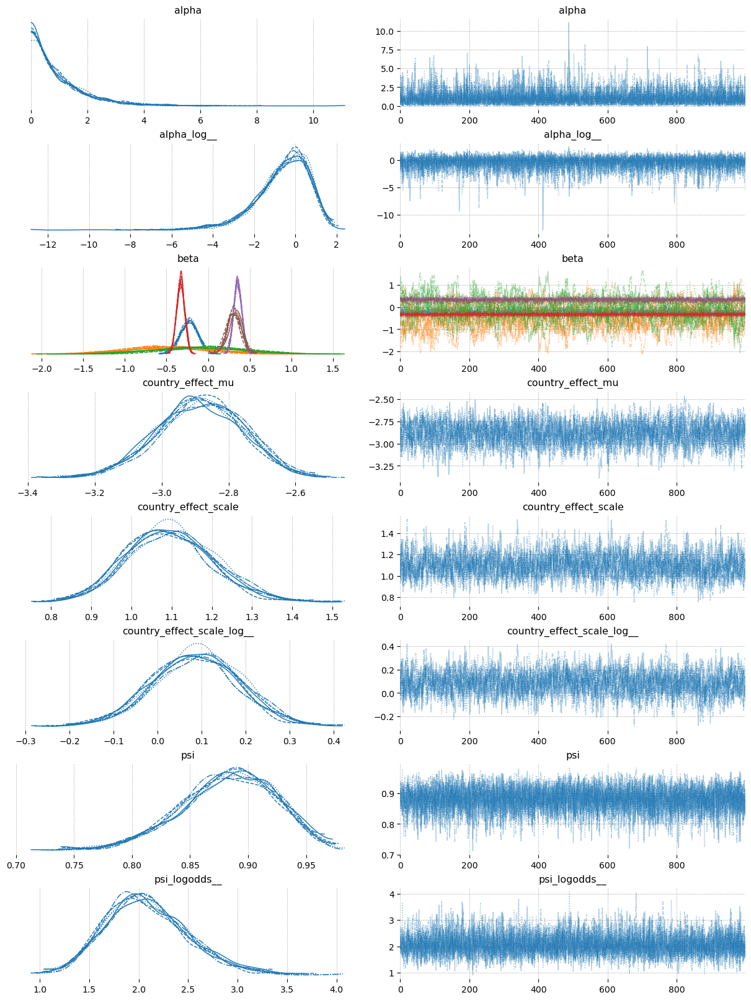

In [71]:
az.plot_trace(version_1_model_Climatological_idata, var_names =  ["~country_effect", "~country_effect_offset"]);

### PPC

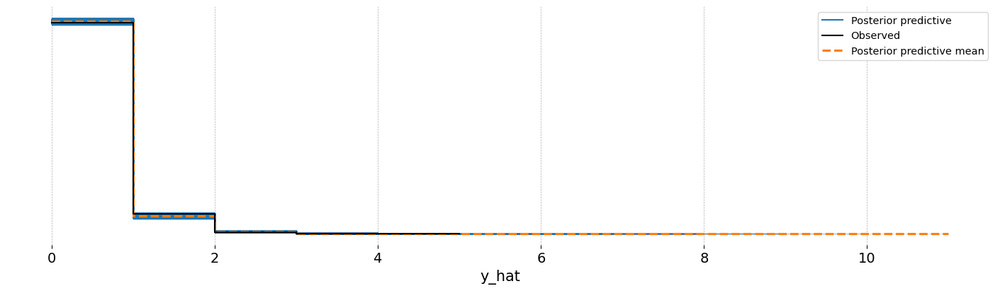

In [72]:
az.plot_ppc(version_1_model_Climatological_idata);

### Posterior

In [73]:
paper_parameters_1C = [-0.105, -1.464, 0.0964, -0.00663, 0.0146 , 0.00147]

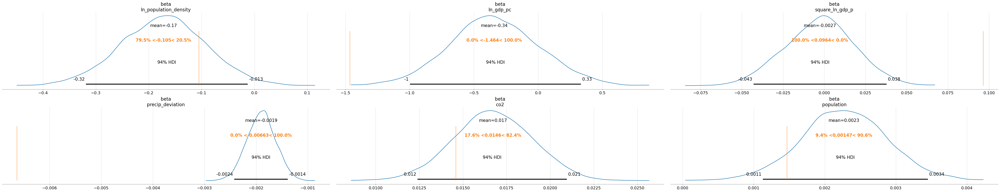

In [74]:
#To de-normalize the parameters
az.plot_posterior((version_1_model_Climatological_idata.posterior.beta / standard_deviations[features_1C].values).astype(float),
                  var_names=["beta"],
                 ref_val= paper_parameters_1C);

###  inverse cdf uniform transform plot

C:\Users\camil\AppData\Local\Temp\ipykernel_81500\2451096162.py:2: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


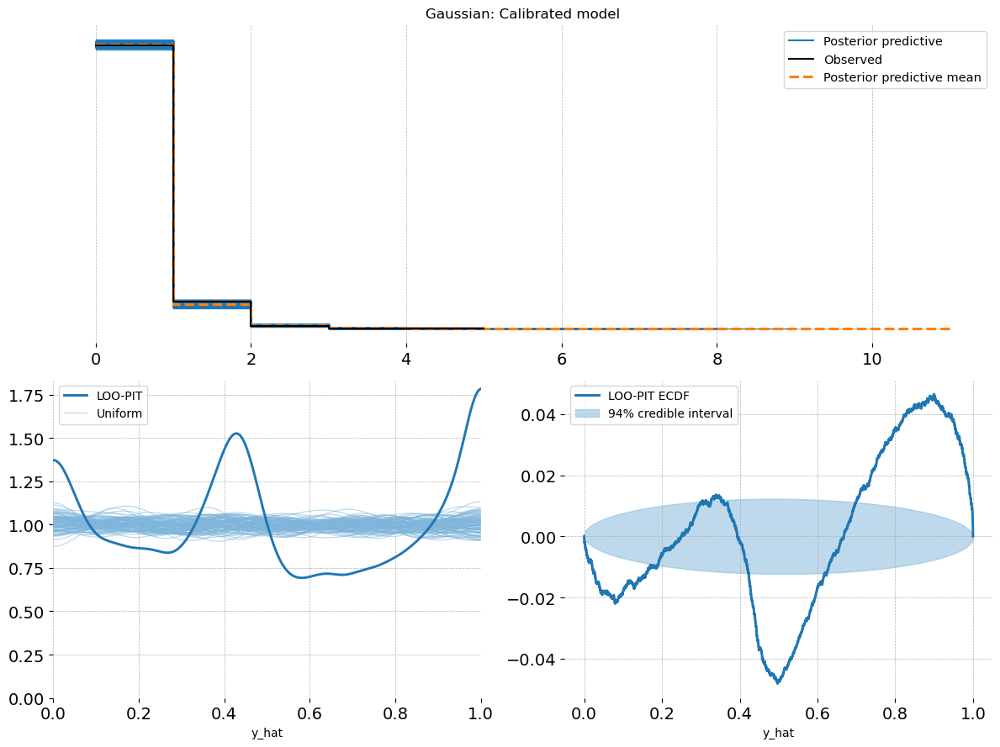

In [75]:
plot_ppc_loopit(version_1_model_Climatological_idata, "Gaussian: Calibrated model")
plt.tight_layout();

### Predictions

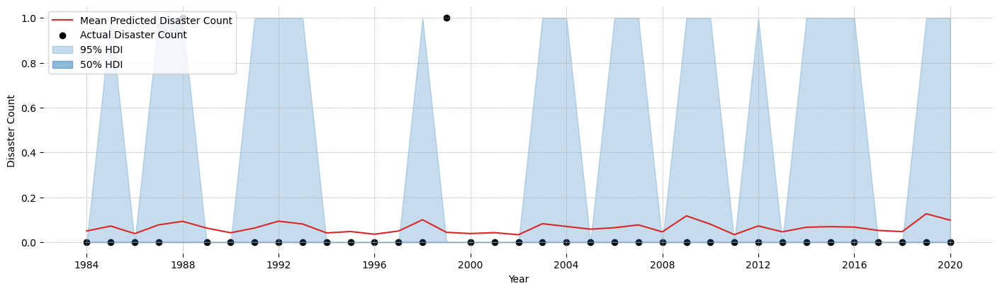

In [76]:
plotting_function(idata = version_1_model_Climatological_idata,
                  disaster_type = "climatological_disasters",
                  country= "LAO")

## version_2_model_Climatological: no co2

In [77]:
#Define features and normalize variables
features_2C = ["ln_population_density", "ln_gdp_pc", "square_ln_gdp_p", "precip_deviation", "dev_from_trend_ocean_temp", "population"]

In [78]:
#Set feature coordinates
COORDS["feature"] =  features_2C

In [79]:
#HydroMeteorological Disasters

with pm.Model(coords=COORDS) as version_2_model_Climatological:
    #Declare data
    X, Y= add_data(features= features_2C ,  target = "climatological_disasters" )

    #Country effect
    country_effect, country_effect_mu, country_effect_scale, country_effect_offset = add_country_effect()

    #Betas
    beta_sigma = [ 1, 1, 1, 1, 1, 1]
    beta = pm.Normal("beta", mu = 0, sigma = beta_sigma, dims = ["feature"])

    #Model mu
    mu = pm.math.exp(country_effect[ISO_idx] + X @ beta)

    y_hat = add_obs_distribution(mu = mu , Y =Y, dist = "ZI_Poisson")

In [80]:
#Sampling
with version_2_model_Climatological:
    version_2_model_Climatological_idata =sample_or_load(
            fp="version_2_model_Climatological",
            resample=False,
            sample_kwargs={
                "nuts_sampler": 'nutpie',
                "chains": 8,
                "draws": 1000,
            })

    version_2_model_Climatological_idata = version_2_model_Climatological_idata.assign_coords(idx)

results_dict["version_2_model_Climatological_idata"] = version_2_model_Climatological_idata

Progress,Draws,Divergences,Step Size,Gradients/Draw
,2000,0,0.27,15
,2000,0,0.26,15
,2000,0,0.27,15
,2000,0,0.29,15
,2000,0,0.27,15
,2000,0,0.27,15
,2000,0,0.26,15
,2000,0,0.24,15


Sampling: [y_hat]


Output()

Output()

### Summary

In [81]:
az.summary(version_2_model_Climatological_idata, ["~country_effect", "~country_effect_offset"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,1.001,1.018,0.000,2.811,0.009,0.008,9074.0,3930.0,1.00
alpha_log__,-0.591,1.293,-3.042,1.532,0.017,0.016,9074.0,3930.0,1.00
beta[ln_population_density],0.061,0.110,-0.144,0.271,0.003,0.002,1343.0,2461.0,1.00
beta[ln_gdp_pc],-0.146,0.538,-1.140,0.875,0.028,0.020,360.0,656.0,1.02
beta[square_ln_gdp_p],-0.135,0.555,-1.106,0.978,0.029,0.021,356.0,653.0,1.02
beta[precip_deviation],-0.318,0.049,-0.412,-0.230,0.000,0.000,10676.0,6198.0,1.00
beta[dev_from_trend_ocean_temp],-0.068,0.042,-0.145,0.017,0.000,0.000,16964.0,5489.0,1.00
beta[population],0.374,0.083,0.225,0.536,0.003,0.002,1000.0,1819.0,1.01
country_effect_mu,-2.809,0.136,-3.063,-2.554,0.004,0.003,1350.0,2469.0,1.01
country_effect_scale,1.148,0.120,0.920,1.364,0.003,0.002,1305.0,2331.0,1.01


### Traces

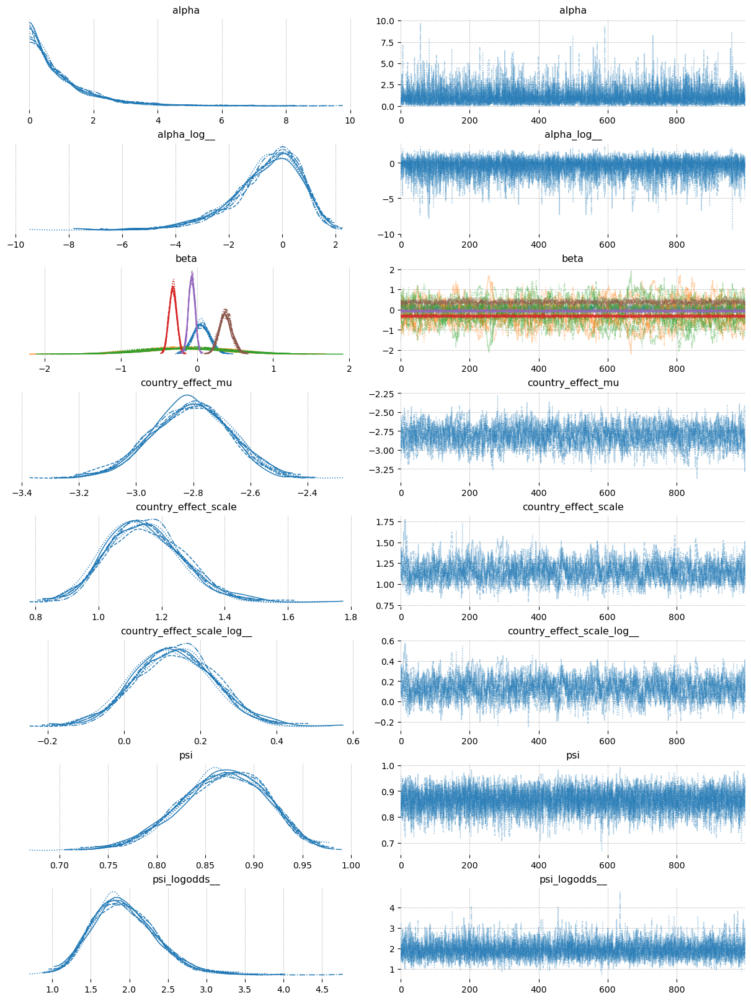

In [82]:
az.plot_trace(version_2_model_Climatological_idata, var_names =  ["~country_effect", "~country_effect_offset"]);

### PPC

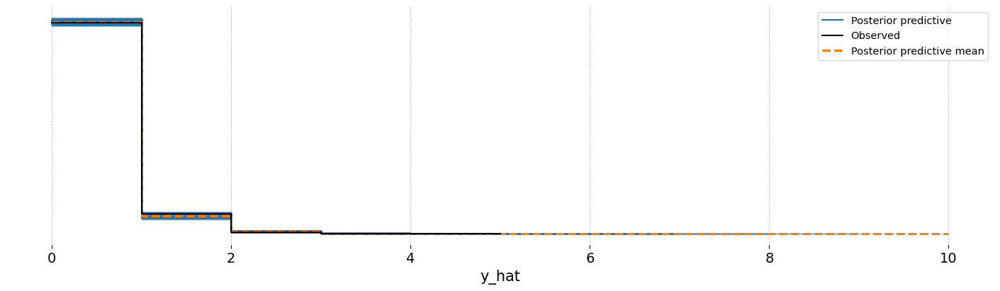

In [83]:
az.plot_ppc(version_2_model_Climatological_idata);

### Posterior

In [84]:
paper_parameters_2C = [-0.0869, -1.343, 0.0895, -0.00622, 1.521, 0.00147]

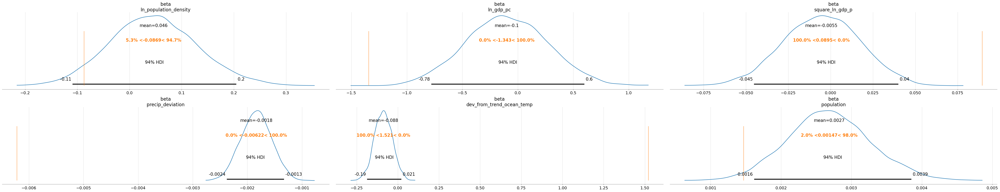

In [85]:
#To de-normalize the parameters
az.plot_posterior((version_2_model_Climatological_idata.posterior.beta / standard_deviations[features_2C].values).astype(float), 
                  var_names=["beta"],
                 ref_val= paper_parameters_2C);

###  inverse cdf uniform transform plot

C:\Users\camil\AppData\Local\Temp\ipykernel_81500\3662240163.py:2: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


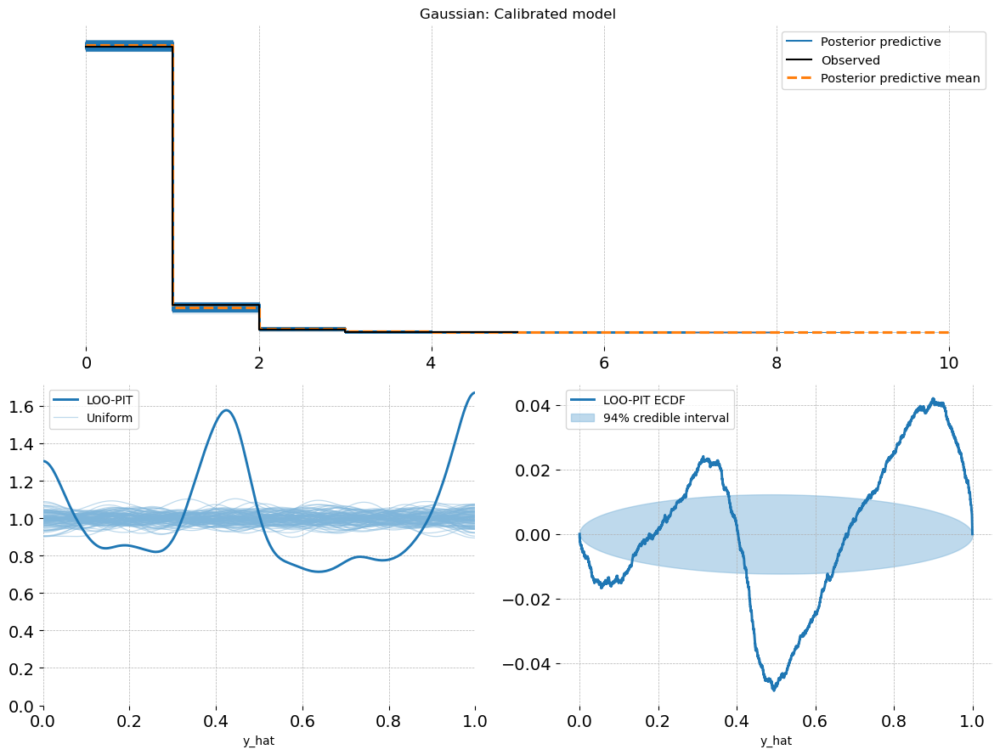

In [86]:
plot_ppc_loopit(version_2_model_Climatological_idata, "Gaussian: Calibrated model")
plt.tight_layout();

### Predictions

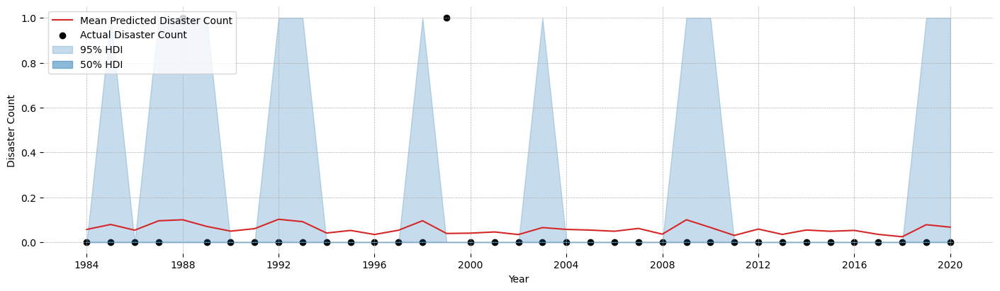

In [87]:
plotting_function(idata = version_2_model_Climatological_idata,
                  disaster_type = "climatological_disasters",
                  country= "LAO")

## version_3_model_Climatological: time trend, no dev_from_trend_ocean_temp, no dev_from_trend_ocean_temp 

In [88]:
#Define features and normalize variables
features_3C = ["ln_population_density", "ln_gdp_pc", "square_ln_gdp_p", "precip_deviation", "population"]

In [89]:
#Set feature coordinates
COORDS["feature"] =  features_3C

In [90]:
#HydroMeteorological Disasters

with pm.Model(coords=COORDS) as version_3_model_Climatological:
    #Declare data
    X, Y, time= add_data(features= features_3C ,  target = "climatological_disasters", add_time=True)

    #Time trend effect
    time_trend = pm.Normal("time_trend", mu =0, sigma =1)
    
    #Country effect
    country_effect, country_effect_mu, country_effect_scale, country_effect_offset = add_country_effect()

    #Betas
    beta_sigma = [ 1, 1, 1, 1, 1]
    beta = pm.Normal("beta", mu = 0, sigma = beta_sigma, dims = ["feature"])

    #Model mu
    mu = pm.math.exp(country_effect[ISO_idx] + time_trend * time +  X @ beta)

    y_hat = add_obs_distribution(mu = mu , Y =Y, dist = "ZI_Poisson")

In [91]:
#Sampling
with version_3_model_Climatological:
    version_3_model_Climatological_idata =sample_or_load(
            fp="version_3_model_Climatological",
            resample=False,
            sample_kwargs={
                "nuts_sampler": 'nutpie',
                "chains": 8,
                "draws": 1000,
            })

    version_3_model_Climatological_idata = version_3_model_Climatological_idata.assign_coords(idx)

results_dict["version_3_model_Climatological_idata"] = version_3_model_Climatological_idata

Progress,Draws,Divergences,Step Size,Gradients/Draw
,2000,0,0.28,15
,2000,0,0.25,15
,2000,0,0.26,15
,2000,0,0.26,15
,2000,0,0.26,15
,2000,0,0.25,15
,2000,0,0.29,15
,2000,0,0.25,15


Sampling: [y_hat]


Output()

Output()

### Summary

In [92]:
az.summary(version_3_model_Climatological_idata, ["~country_effect", "~country_effect_offset"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,0.998,1.005,0.000,2.805,0.009,0.008,7640.0,3298.0,1.00
alpha_log__,-0.589,1.305,-2.980,1.507,0.019,0.019,7640.0,3298.0,1.00
beta[ln_population_density],-0.187,0.109,-0.386,0.019,0.003,0.002,1341.0,2353.0,1.00
beta[ln_gdp_pc],-0.479,0.552,-1.538,0.511,0.029,0.020,372.0,773.0,1.01
beta[square_ln_gdp_p],-0.038,0.565,-1.086,1.013,0.029,0.021,379.0,724.0,1.01
beta[precip_deviation],-0.329,0.049,-0.422,-0.239,0.000,0.000,10448.0,6152.0,1.00
beta[population],0.329,0.083,0.180,0.492,0.003,0.002,937.0,1877.0,1.01
country_effect_mu,-3.427,0.163,-3.735,-3.118,0.005,0.003,1300.0,2356.0,1.00
country_effect_scale,1.086,0.109,0.895,1.295,0.003,0.002,1284.0,2784.0,1.00
country_effect_scale_log__,0.078,0.100,-0.104,0.265,0.003,0.002,1284.0,2784.0,1.00


### Traces

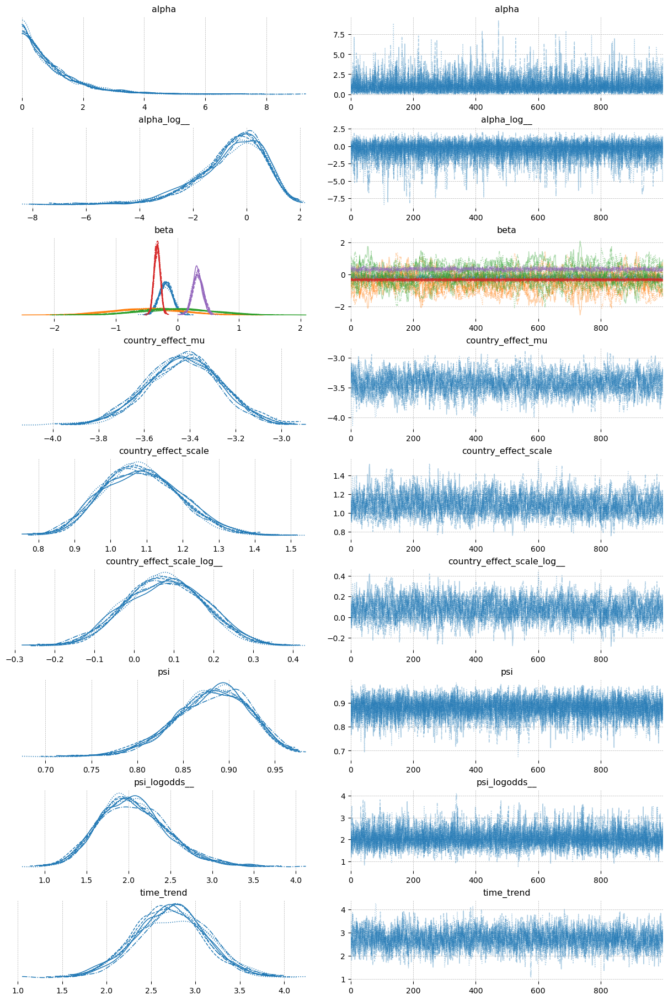

In [93]:
az.plot_trace(version_3_model_Climatological_idata, var_names =  ["~country_effect", "~country_effect_offset"]);

### PPC

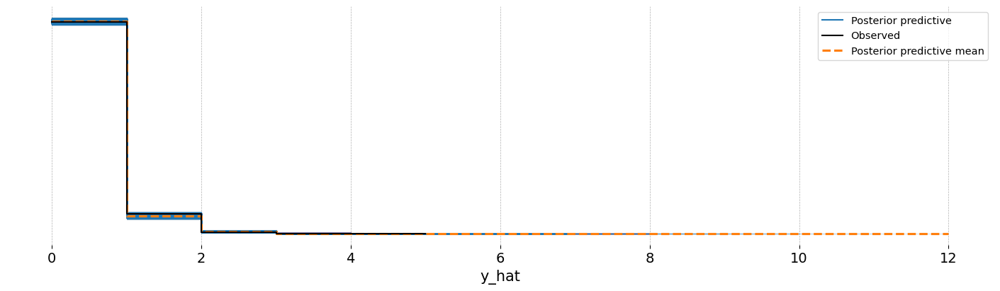

In [94]:
az.plot_ppc(version_3_model_Climatological_idata);

### Posterior

In [95]:
paper_parameters_3C = [-0.111, -1.525, 0.0994, -0.00619, -0.0915, 0.00153]

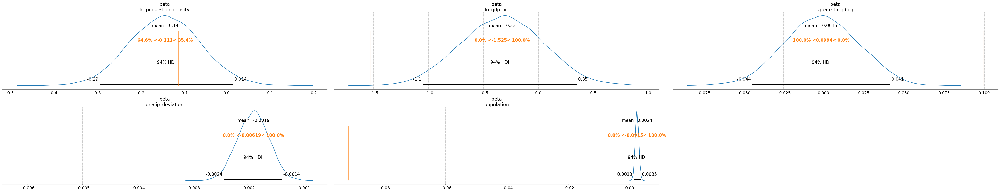

In [96]:
#To de-normalize the parameters
az.plot_posterior((version_3_model_Climatological_idata.posterior.beta / standard_deviations[features_3C].values).astype(float), 
                  var_names=["beta"],
                 ref_val= paper_parameters_3C);

###  inverse cdf uniform transform plot

C:\Users\camil\AppData\Local\Temp\ipykernel_81500\963944840.py:2: UserWarning: The figure layout has changed to tight
  plt.tight_layout();


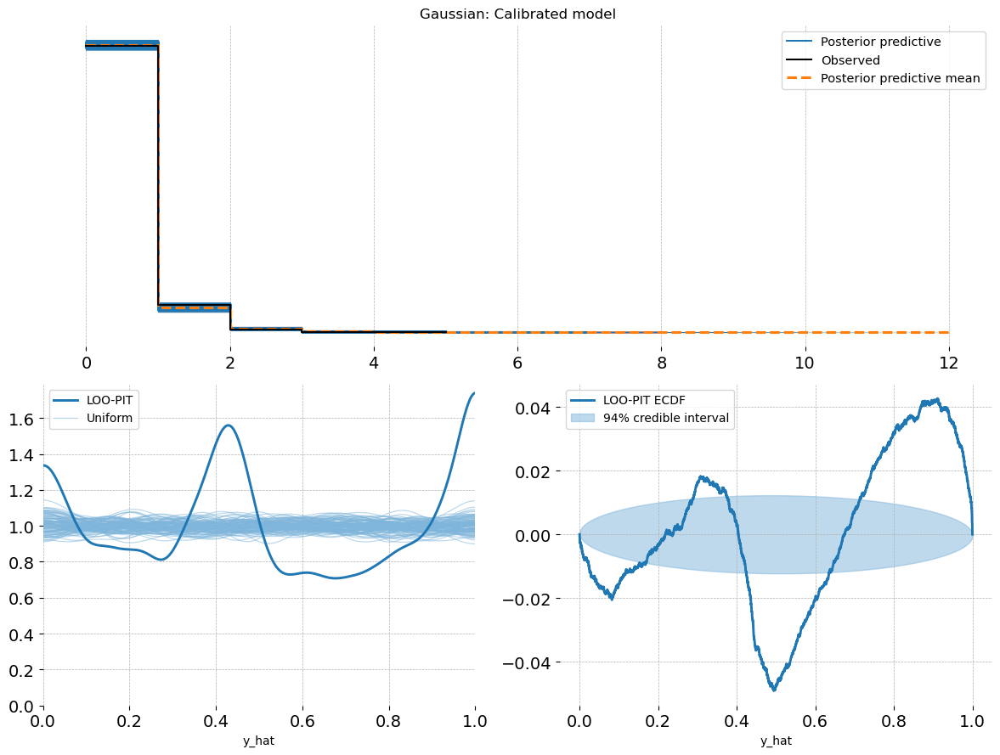

In [97]:
plot_ppc_loopit(version_3_model_Climatological_idata, "Gaussian: Calibrated model")
plt.tight_layout();

### Predictions

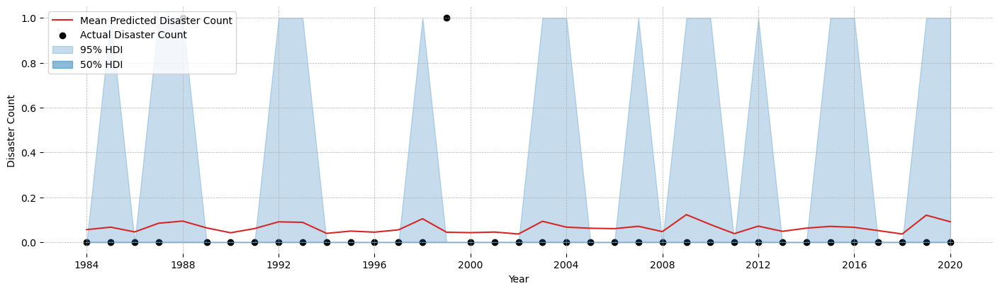

In [98]:
plotting_function(idata = version_3_model_Climatological_idata,
                  disaster_type = "climatological_disasters",
                  country= "LAO") 